In [1]:
import numpy as np
import pandas as pd

In [2]:
df=pd.read_csv("C:/Users/Damodhara/Desktop/DSMP/PCA/train.csv")

In [3]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
df.shape

(42000, 785)

In [5]:
df.sample()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
13383,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
import matplotlib.pyplot as plt

In [7]:
X=df.iloc[:,1:]

In [8]:
y=df.iloc[:,0]

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [11]:
X_train.shape

(33600, 784)

In [12]:
from sklearn.neighbors import KNeighborsClassifier

In [13]:
knn=KNeighborsClassifier()

In [14]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [15]:
y_pred=knn.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [16]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [17]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [18]:
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

In [19]:
#PCA
from sklearn.decomposition import PCA
pca=PCA(n_components=100)

In [20]:
X_train_trf=pca.fit_transform(X_train)
X_test_trf=pca.transform(X_test)

In [21]:
X_train_trf.shape

(33600, 100)

In [22]:
knn=KNeighborsClassifier()

In [23]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [24]:
y_prd=knn.predict(X_test_trf)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [25]:
accuracy_score(y_test,y_pred)

0.9648809523809524

In [27]:
#transforming to a 2D coordinate system 
pca=PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf= pca.transform(X_test)

In [28]:
X_train_trf

array([[-2.71861575, -0.4898714 ],
       [-0.67700511, -6.7539829 ],
       [-3.03325602,  6.50994203],
       ...,
       [ 2.14883665,  0.78086371],
       [ 1.05960331,  0.94773681],
       [17.70262389,  1.96197582]])

In [30]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig= px.scatter(x=X_train_trf[:,0],
                y=X_train_trf[:,1],
                color=y_train_trf,
                color_discrete_sequence=px.colors.qualitative.G10
               )
fig.show()

In [32]:
#transforming in 3D
pca=PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [33]:
X_train_trf

array([[-2.7186541 , -0.48962104,  1.1349796 ],
       [-0.67697003, -6.7538789 , -2.33491375],
       [-3.0332389 ,  6.50995863,  7.4921458 ],
       ...,
       [ 2.14882242,  0.78025287, -0.74728988],
       [ 1.05954253,  0.94798622,  3.94856296],
       [17.70257675,  1.962536  , -4.94379739]])

In [34]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0],y=X_train_trf[:,1], z=X_train_trf[:,2],
                      color=y_train_trf)
fig.update_layout(
    
    margin=dict(l=20,r=20,t=20,b=20)
)
fig.show()


In [35]:
#PCA Attributes 
pca.explained_variance_

# explained _ variance finds the eigen values 

array([40.67111198, 29.17023394, 26.74459573])

In [36]:
pca.components_

array([[-3.09098044e-18, -1.30353603e-18,  5.75090794e-21, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-5.16552062e-17, -1.83055904e-17,  3.10035513e-18, ...,
        -0.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [ 3.73567384e-17,  2.10752233e-17,  4.41156540e-18, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00]])

In [37]:
pca.components_.shape
#eigen vectors 

(3, 784)

In [ ]:
#finding optimum number of principle components 

In [38]:
pca=PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf= pca.transform(X_test)

In [39]:
pca.explained_variance_.shape

(784,)

In [43]:
pca.components_.shape

(784, 784)

In [44]:
pca.explained_variance_ratio_

array([5.78519225e-02, 4.14926968e-02, 3.80423901e-02, 2.96626277e-02,
       2.58156168e-02, 2.25498018e-02, 1.97306802e-02, 1.77527998e-02,
       1.56865066e-02, 1.43606328e-02, 1.37025484e-02, 1.22725500e-02,
       1.14691200e-02, 1.12302739e-02, 1.05852885e-02, 1.01993106e-02,
       9.57676152e-03, 9.42708817e-03, 9.12489429e-03, 8.90170190e-03,
       8.39940495e-03, 8.20063196e-03, 7.85303229e-03, 7.56739707e-03,
       7.37261022e-03, 7.01884653e-03, 6.97919728e-03, 6.71104483e-03,
       6.39845030e-03, 6.30337291e-03, 6.15350848e-03, 6.02388659e-03,
       5.83673972e-03, 5.78547759e-03, 5.72333148e-03, 5.46399774e-03,
       5.43207369e-03, 5.28172755e-03, 5.13381744e-03, 4.94015474e-03,
       4.87671103e-03, 4.81978768e-03, 4.68204430e-03, 4.59342487e-03,
       4.57660834e-03, 4.49219022e-03, 4.44682221e-03, 4.41540749e-03,
       4.35111936e-03, 4.32032928e-03, 4.21808870e-03, 4.18243127e-03,
       4.07994349e-03, 4.02004913e-03, 3.98335855e-03, 3.94598812e-03,
      

In [45]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

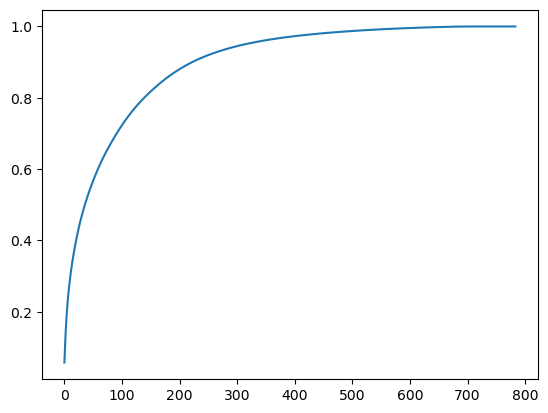

In [46]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))